In [1]:
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Image
from qutip import (
    Qobj,
    basis,
    coherent,
    coherent_dm,
    create,
    destroy,
    expect,
    fock_dm,
    mesolve,
    qeye,
    sigmax,
    sigmay,
    sigmaz,
    tensor,
    anim_matrix_histogram,
    ket2dm,
)

from matplotlib import rc

rc("animation", html="jshtml")
%matplotlib inline

In [6]:
N = 3
basis(N, 0)

Quantum object: dims=[[3], [1]], shape=(3, 1), type='ket', dtype=Dense
Qobj data =
[[1.]
 [0.]
 [0.]]

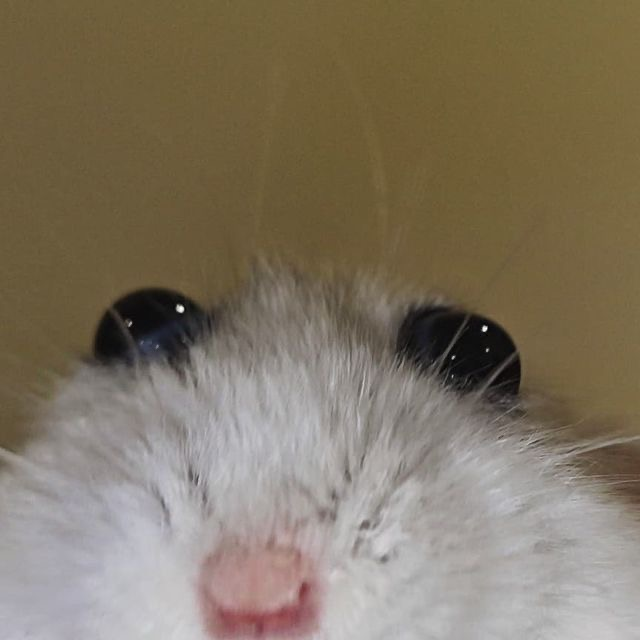

In [11]:
Image(filename="./hampter.jpeg")

In [12]:
"""
    Create Qobj like this
    Qobj is representing objects, such as quantum operators and states
"""
q = Qobj([[1], [0]])
q

Quantum object: dims=[[2], [1]], shape=(2, 1), type='ket', dtype=Dense
Qobj data =
[[1.]
 [0.]]

In [13]:
# properties of your qobj
# isherm : is-hermitian
# type: type of object (i.e. "bra", "ket", "oper", "operator-ket", "operator-bra", "super)
q.isherm, q.type

(False, 'ket')

In [15]:
zero = basis(2, 0)
one = basis(2, 1)

# Create and normalize superposition
psi = (zero - one).unit()

# Print state
psi
ket2dm(psi)

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=Dense, isherm=True
Qobj data =
[[ 0.5 -0.5]
 [-0.5  0.5]]

In [8]:
tensor(psi, basis(2, 0))

Quantum object: dims=[[2, 2], [1, 1]], shape=(4, 1), type='ket', dtype=Dense
Qobj data =
[[0.70710678]
 [0.        ]
 [0.70710678]
 [0.        ]]

In [5]:
# Operator as Qobj
sz = Qobj([[1, 0], [0, -1]])
sz

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=Dense, isherm=True
Qobj data =
[[ 1.  0.]
 [ 0. -1.]]

In [6]:
sy = Qobj([[0, -1.0j], [1.0j, 0]])
sy

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=Dense, isherm=True
Qobj data =
[[ 0.+0.j -0.-1.j]
 [ 0.+1.j  0.+0.j]]

In [7]:
# Define bigger operator based off of two operators
H = sz + sy
H

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=Dense, isherm=True
Qobj data =
[[ 1.+0.j  0.-1.j]
 [ 0.+1.j -1.+0.j]]

# Funny extra functions of Qobj
```py
.copy() # for copying Qobj
.conj() # conjugate of Qobj
.dag()  # dagger 
.diag() # diagonal elements of Qobj
.expm() # matrix exponential
.logm() # matrix logarithm
.eigenenergies() # duh
.eigenstates() #duh
```

In [8]:
H.eigenstates()

(array([-1.41421356,  1.41421356]),
 array([Quantum object: dims=[[2], [1]], shape=(2, 1), type='ket', dtype=Dense
        Qobj data =
        [[-0.38268343+0.j        ]
         [ 0.        +0.92387953j]]                                           ,
        Quantum object: dims=[[2], [1]], shape=(2, 1), type='ket', dtype=Dense
        Qobj data =
        [[-0.92387953+0.j        ]
         [ 0.        -0.38268343j]]                                           ],
       dtype=object))

In [9]:
"""
    Don't usually need to create Qobj_s from scratch but can also go ahead like this
"""
N = 2
n = 0  # ground state
print(basis(N, n))
n = 1  # excited state
print(basis(N, n))

Quantum object: dims=[[2], [1]], shape=(2, 1), type='ket', dtype=Dense
Qobj data =
[[1.]
 [0.]]
Quantum object: dims=[[2], [1]], shape=(2, 1), type='ket', dtype=Dense
Qobj data =
[[0.]
 [1.]]


In [10]:
# coherent state
coherent(N=4, alpha=1.0)

Quantum object: dims=[[4], [1]], shape=(4, 1), type='ket', dtype=Dense
Qobj data =
[[0.60605894]
 [0.6100857 ]
 [0.41242505]
 [0.30065525]]

In [11]:
# fock state as density matrix
fock_dm(5, 2)  # 5 = hilbert space size, 2 = state that is occupied

Quantum object: dims=[[5], [5]], shape=(5, 5), type='oper', dtype=Dia, isherm=True
Qobj data =
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]

In [12]:
# coherent state as dm
coherent_dm(N=5, alpha=1)

Quantum object: dims=[[5], [5]], shape=(5, 5), type='oper', dtype=Dense, isherm=True
Qobj data =
[[0.36791117 0.36774407 0.26105441 0.14620658 0.08826704]
 [0.36774407 0.36757705 0.26093584 0.14614018 0.08822695]
 [0.26105441 0.26093584 0.18523331 0.10374209 0.06263061]
 [0.14620658 0.14614018 0.10374209 0.05810197 0.035077  ]
 [0.08826704 0.08822695 0.06263061 0.035077   0.0211765 ]]

# Operators

## Pauli Matrices

In [13]:
sigmax()

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=CSR, isherm=True
Qobj data =
[[0. 1.]
 [1. 0.]]

In [14]:
sigmay()

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=CSR, isherm=True
Qobj data =
[[0.+0.j 0.-1.j]
 [0.+1.j 0.+0.j]]

In [15]:
sigmaz()

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=CSR, isherm=True
Qobj data =
[[ 1.  0.]
 [ 0. -1.]]

## Harmonic Oscillator operators

In [16]:
# annihilation
destroy(N=4)

Quantum object: dims=[[4], [4]], shape=(4, 4), type='oper', dtype=Dia, isherm=False
Qobj data =
[[0.         1.         0.         0.        ]
 [0.         0.         1.41421356 0.        ]
 [0.         0.         0.         1.73205081]
 [0.         0.         0.         0.        ]]

In [17]:
# creation
create(N=4)

Quantum object: dims=[[4], [4]], shape=(4, 4), type='oper', dtype=Dia, isherm=False
Qobj data =
[[0.         0.         0.         0.        ]
 [1.         0.         0.         0.        ]
 [0.         1.41421356 0.         0.        ]
 [0.         0.         1.73205081 0.        ]]

In [18]:
# position operator
x = destroy(4) + destroy(4).dag()
x

Quantum object: dims=[[4], [4]], shape=(4, 4), type='oper', dtype=Dia, isherm=True
Qobj data =
[[0.         1.         0.         0.        ]
 [1.         0.         1.41421356 0.        ]
 [0.         1.41421356 0.         1.73205081]
 [0.         0.         1.73205081 0.        ]]

# Some fancy stuff

In [19]:
# Check known commutator relations
def commutator(op1, op2):
    return op1 * op2 - op2 * op1

In [20]:
a = destroy(5)
commutator(a, a.dag())

Quantum object: dims=[[5], [5]], shape=(5, 5), type='oper', dtype=Dia, isherm=True
Qobj data =
[[ 1.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.]
 [ 0.  0.  1.  0.  0.]
 [ 0.  0.  0.  1.  0.]
 [ 0.  0.  0.  0. -4.]]

Ops... The result is not identity! Why? Because we have truncated the Hilbert space. But that's OK as long as the highest Fock state isn't involved in the dynamics in our truncated Hilbert space. If it is, the approximation that the truncation introduces might be a problem.

In [21]:
x = (a + a.dag()) / np.sqrt(2)
p = -1j * (a - a.dag()) / np.sqrt(2)

In [22]:
commutator(x, p)

Quantum object: dims=[[5], [5]], shape=(5, 5), type='oper', dtype=Dia, isherm=False
Qobj data =
[[0.+1.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j]
 [0.+0.j 0.+1.j 0.+0.j 0.+0.j 0.+0.j]
 [0.+0.j 0.+0.j 0.+1.j 0.+0.j 0.+0.j]
 [0.+0.j 0.+0.j 0.+0.j 0.+1.j 0.+0.j]
 [0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.-4.j]]

Same issue with the truncated Hilbert space, but otherwise OK.

In [23]:
commutator(sigmax(), sigmay()) - 2j * sigmaz()

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=CSR, isherm=True
Qobj data =
[[0. 0.]
 [0. 0.]]

# Composite systems
e.g. when qubit is coupled to a cavity

Example: Consider a system composed of two qubits. If we want to create a Pauli $\sigma_z$ operator that acts on the first qubit and leaves the second qubit unaffected (i.e., the operator $\sigma_z\otimes 1$ we would do:

In [24]:
# qeye generates identity operator with N quantum states
sz1 = tensor(sigmaz(), qeye(2))
sz1

Quantum object: dims=[[2, 2], [2, 2]], shape=(4, 4), type='oper', dtype=CSR, isherm=True
Qobj data =
[[ 1.  0.  0.  0.]
 [ 0.  1.  0.  0.]
 [ 0.  0. -1.  0.]
 [ 0.  0.  0. -1.]]

In [64]:
# Check if it does what it needs to do
print(N)
psi1 = tensor(basis(N, 1), basis(N, 0))  # |10>
psi2 = tensor(basis(N, 0), basis(N, 1))  # |01>
psi2

2


Quantum object: dims=[[2, 2], [1, 1]], shape=(4, 1), type='ket', dtype=Dense
Qobj data =
[[0.]
 [1.]
 [0.]
 [0.]]

In [26]:
sz1 * psi1 == psi1
# Should not be true because sz1 should flip sign of the excited state of ps1

False

In [27]:
sz1 * psi2 == psi2
# Should be true because pauli only acts on first qubit

True

# Jaynes-Cummings Hamiltonian

$H = \omega_ca^{\dagger}a -\frac{1}{2}\omega_a\sigma_z + g(a\sigma_{+} + a^{\dagger}\sigma_{-})$

In [28]:
wc = 1.0  # cavity frequency
wa = 1.0  # qubit/atom frequency
g = 0.1  # coupling strength
N = 10
# cavity field operator
a = tensor(destroy(N), qeye(2))

# qubit/atom operators
sz = tensor(qeye(N), sigmaz())  # sigma-z operator
sm = tensor(qeye(N), destroy(2))  # sigma-minus operator

# Hamiltonian
H = wc * a.dag() * a - 1 / 2 * wa * sz + g * (a * sm.dag() + a.dag() * sm)
H

Quantum object: dims=[[10, 2], [10, 2]], shape=(20, 20), type='oper', dtype=CSR, isherm=True
Qobj data =
[[-0.5         0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.5         0.1         0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.1         0.5         0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          1.5         0.14142136  0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.     

# Unitary dynamics

Can solve for unitary evolution (so what the master equation would do) with `mesolve` function

For example, consider a qubit with Hamiltonian $H=\sigma_x$ and initial state $\ket{1}$ (in the sigma-z basis): Its evolution can be calculated as follows:

In [3]:
H = sigmax()

psi0 = basis(2, 0)

tlist = np.linspace(0, 10, 100)

result = mesolve(H, psi0, tlist, [], [])

print(psi0.dims)
print(H.dims)
psi0

[[2], [1]]
[[2], [2]]


/home/lz/Documents/uni/master/master_thesis/code/.venv/lib/python3.13/site-packages/qutip/solver/solver_base.py:576: FutureWarning: e_ops will be keyword only from qutip 5.3 for all solver
  warnings.warn(


Quantum object: dims=[[2], [1]], shape=(2, 1), type='ket', dtype=Dense
Qobj data =
[[1.]
 [0.]]

In [30]:
result

<Result
  Solver: sesolve
  Solver stats:
    method: 'scipy zvode adams'
    init time: 0.0001804828643798828
    preparation time: 9.72747802734375e-05
    run time: 0.0013096332550048828
    solver: 'Schrodinger Evolution'
  Time interval: [0.0, 10.0] (100 steps)
  Number of e_ops: 0
  States saved.
>

In [43]:
print(result.expect)

[array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), array([ 0.        , -0.2006488 , -0.39313655, -0.56963403, -0.72296249,
       -0.8468855 , -0.93636272, -0.98775472, -0.99897116, -0.96955585,
       -0.90070527, -0.79521976, -0.65738979, -0.4928213 , -0.30820799,
       -0.11105889,  0.09060728,  0.28858824,  0.47483144,  0.64176149,
        0.78258874,  0.89158527,  0.96431779,  0.99782796,  0.99075284,
        0.94338017,  0.85763681,  0.73701024,  0.58640671,  0.41195198,
        0.22074184,  0.02055336, -0.18047127, -0.37415561, -0.55262159,
       -0.70861044, -0.83577756, -0.92895054, -0.98

In [42]:
len(result)

3

In [32]:
fig, ani = anim_matrix_histogram(
    result, limits=[0, 1], bar_style="abs", color_style="phase"
)
plt.close()
ani

# Expectation values
The expectation values of an operator given a state vector or density matrix (or list thereof) can be calculated using the `expect` function.

In [33]:
expect(sigmaz(), result.states[-1])

0.40806479408005597

In [34]:
expect(sigmaz(), result.states)

array([ 1.        ,  0.97966324,  0.9194801 ,  0.82189845,  0.69088728,
        0.53177528,  0.35103398,  0.15601481, -0.04535002, -0.24487027,
       -0.43443068, -0.60632131, -0.7535507 , -0.87013055, -0.951319  ,
       -0.99381383, -0.9958867 , -0.9574533 , -0.88007676, -0.76690429,
       -0.62253905, -0.45285285, -0.26474744, -0.06587387,  0.13567909,
        0.3317135 ,  0.51425587,  0.67588157,  0.81001677,  0.91120556,
        0.97533227,  0.99978876,  0.98358026,  0.92736593,  0.83343229,
        0.70559992,  0.54906818,  0.37020385,  0.17628203, -0.0248099 ,
       -0.22489269, -0.41582823, -0.58985057, -0.73988155, -0.85981879,
       -0.9447841 , -0.9913216 , -0.99753841, -0.96318177, -0.88964906,
       -0.77993099, -0.6384903 , -0.47107995, -0.284509  , -0.08636599,
        0.11528974,  0.31225626,  0.49652225,  0.66059275,  0.79779446,
        0.90254706,  0.97058988,  0.99915523,  0.98708135,  0.93485936,
        0.84461322,  0.7200135 ,  0.56612831,  0.38921658,  0.19

Text(0, 0.5, '$\\left<\\sigma_z\\right>$')

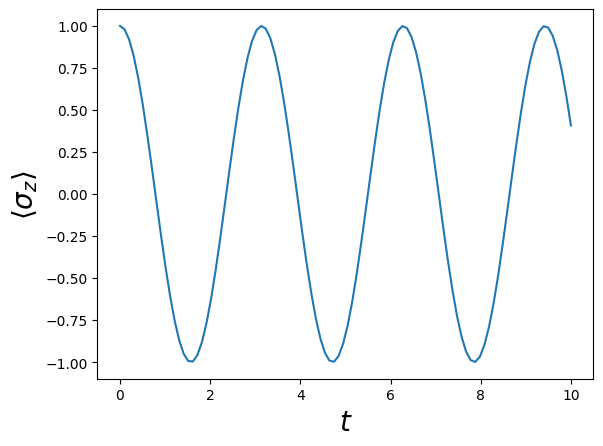

In [35]:
fix, axes = plt.subplots(1, 1)

axes.plot(tlist, expect(sigmaz(), result.states))
axes.set_xlabel(r"$t$", fontsize=20)
axes.set_ylabel(r"$\left<\sigma_z\right>$", fontsize=20)

If you want to run `mesolve` on multiple operators you can parse them as a list

In [36]:
result = mesolve(H, psi0, tlist, [], [sigmax(), sigmay(), sigmaz()])

/home/lz/Documents/uni/master/master_thesis/code/.venv/lib/python3.13/site-packages/qutip/solver/solver_base.py:576: FutureWarning: e_ops will be keyword only from qutip 5.3 for all solver
  warnings.warn(


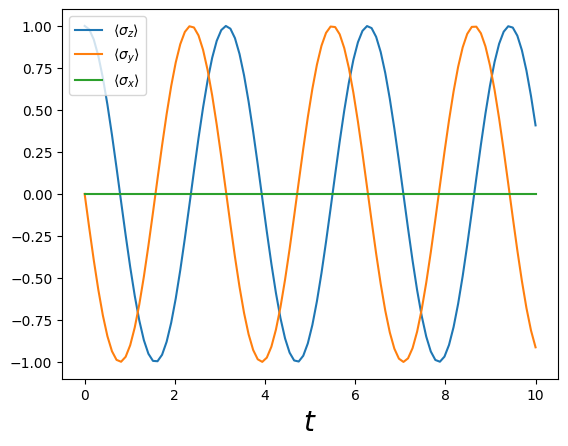

In [37]:
fig, axes = plt.subplots(1, 1)

axes.plot(tlist, result.expect[2], label=r"$\left<\sigma_z\right>$")
axes.plot(tlist, result.expect[1], label=r"$\left<\sigma_y\right>$")
axes.plot(tlist, result.expect[0], label=r"$\left<\sigma_x\right>$")

axes.set_xlabel(r"$t$", fontsize=20)
axes.legend(loc=2);

In [63]:
wc = 1.0  # cavity frequency
wa = 1.0  # qubit/atom frequency
g = 0.1  # coupling strength
N = 2
# cavity field operator
a = tensor(destroy(N), qeye(2))

# qubit/atom operators
sz = tensor(qeye(N), sigmaz())  # sigma-z operator
sm = tensor(qeye(N), destroy(2))  # sigma-minus operator

# Hamiltonian
H = wc * a.dag() * a - 1 / 2 * wa * sz + g * (a * sm.dag() + a.dag() * sm)


# Starting state
psi0 = basis(N, 0)

tlist = np.linspace(0, 10, 100)

print(psi0.dims)
H
# result = mesolve(H,psi0,tlist,[],[])

[[2], [1]]


Quantum object: dims=[[2, 2], [2, 2]], shape=(4, 4), type='oper', dtype=CSR, isherm=True
Qobj data =
[[-0.5  0.   0.   0. ]
 [ 0.   0.5  0.1  0. ]
 [ 0.   0.1  0.5  0. ]
 [ 0.   0.   0.   1.5]]